In [55]:
import pandas as pd
import matplotlib.pyplot as plt
import tabulate
import seaborn as sns
import researchpy as rp
import pandas_profiling
import ydata_profiling

In [56]:

data= pd.read_csv("G:\\My Drive\\Ryerson\\Capstone\\METABRIC_RNA_Mutation.csv\\METABRIC_RNA_Mutation.csv", sep=",")

C:\Users\mdaum\AppData\Local\Temp\ipykernel_12896\4282095328.py:1: DtypeWarning: Columns (678,688,690,692) have mixed types. Specify dtype option on import or set low_memory=False.
  data= pd.read_csv("G:\\My Drive\\Ryerson\\Capstone\\METABRIC_RNA_Mutation.csv\\METABRIC_RNA_Mutation.csv", sep=",")


In [57]:
data.head()


,patient_id,age_at_diagnosis,type_of_breast_surgery,cancer_type,cancer_type_detailed,cellularity,chemotherapy,pam50_+_claudin-low_subtype,cohort,er_status_measured_by_ihc,...,mtap_mut,ppp2cb_mut,smarcd1_mut,nras_mut,ndfip1_mut,hras_mut,prps2_mut,smarcb1_mut,stmn2_mut,siah1_mut
0,0,75.65,MASTECTOMY,Breast Cancer,Breast Invasive Ductal Carcinoma,NaN,0,claudin-low,1.0,Positve,...,0,0,0,0,0,0,0,0,0,0
1,2,43.19,BREAST CONSERVING,Breast Cancer,Breast Invasive Ductal Carcinoma,High,0,LumA,1.0,Positve,...,0,0,0,0,0,0,0,0,0,0
2,5,48.87,MASTECTOMY,Breast Cancer,Breast Invasive Ductal Carcinoma,High,1,LumB,1.0,Positve,...,0,0,0,0,0,0,0,0,0,0
3,6,47.68,MASTECTOMY,Breast Cancer,Breast Mixed Ductal and Lobular Carcinoma,Moderate,1,LumB,1.0,Positve,...,0,0,0,0,0,0,0,0,0,0
4,8,76.97,MASTECTOMY,Breast Cancer,Breast Mixed Ductal and Lobular Carcinoma,High,1,LumB,1.0,Positve,...,0,0,0,0,0,0,0,0,0,0


In [58]:
nRow, nCol = data.shape
print(f'There are {nRow} rows and {nCol} columns')

There are 1904 rows and 693 columns


Subsetting clinical data except the patient id column  and description of clinical data

In [59]:
df_clinical =data.iloc[:, 1:31]
df_clinical.info()
df_clinical.describe()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1904 entries, 0 to 1903
Data columns (total 30 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   age_at_diagnosis                1904 non-null   float64
 1   type_of_breast_surgery          1882 non-null   object 
 2   cancer_type                     1904 non-null   object 
 3   cancer_type_detailed            1889 non-null   object 
 4   cellularity                     1850 non-null   object 
 5   chemotherapy                    1904 non-null   int64  
 6   pam50_+_claudin-low_subtype     1904 non-null   object 
 7   cohort                          1904 non-null   float64
 8   er_status_measured_by_ihc       1874 non-null   object 
 9   er_status                       1904 non-null   object 
 10  neoplasm_histologic_grade       1832 non-null   float64
 11  her2_status_measured_by_snp6    1904 non-null   object 
 12  her2_status                     19

,age_at_diagnosis,chemotherapy,cohort,neoplasm_histologic_grade,hormone_therapy,lymph_nodes_examined_positive,mutation_count,nottingham_prognostic_index,overall_survival_months,overall_survival,radio_therapy,tumor_size,tumor_stage
count,1904.000000,1904.000000,1904.000000,1832.000000,1904.000000,1904.000000,1859.000000,1904.000000,1904.000000,1904.000000,1904.000000,1884.000000,1403.000000
mean,61.087054,0.207983,2.643908,2.415939,0.616597,2.002101,5.697687,4.033019,125.121324,0.420693,0.597164,26.238726,1.750535
std,12.978711,0.405971,1.228615,0.650612,0.486343,4.079993,4.058778,1.144492,76.334148,0.493800,0.490597,15.160976,0.628999
min,21.930000,0.000000,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000
25%,51.375000,0.000000,1.000000,2.000000,0.000000,0.000000,3.000000,3.046000,60.825000,0.000000,0.000000,17.000000,1.000000
50%,61.770000,0.000000,3.000000,3.000000,1.000000,0.000000,5.000000,4.042000,115.616667,0.000000,1.000000,23.000000,2.000000
75%,70.592500,0.000000,3.000000,3.000000,1.000000,2.000000,7.000000,5.040250,184.716667,1.000000,1.000000,30.000000,2.000000
max,96.290000,1.000000,5.000000,3.000000,1.000000,45.000000,80.000000,6.360000,355.200000,1.000000,1.000000,182.000000,4.000000


In [60]:
#Finding missing data and the percentage of it in each column
total = df_clinical.isnull().sum().sort_values(ascending = False)
total


tumor_stage                       501
3-gene_classifier_subtype         204
primary_tumor_laterality          106
neoplasm_histologic_grade          72
cellularity                        54
mutation_count                     45
er_status_measured_by_ihc          30
type_of_breast_surgery             22
tumor_size                         20
tumor_other_histologic_subtype     15
cancer_type_detailed               15
oncotree_code                      15
death_from_cancer                   1
overall_survival_months             0
overall_survival                    0
radio_therapy                       0
nottingham_prognostic_index         0
pr_status                           0
age_at_diagnosis                    0
lymph_nodes_examined_positive       0
integrative_cluster                 0
hormone_therapy                     0
her2_status                         0
her2_status_measured_by_snp6        0
er_status                           0
cohort                              0
pam50_+_clau

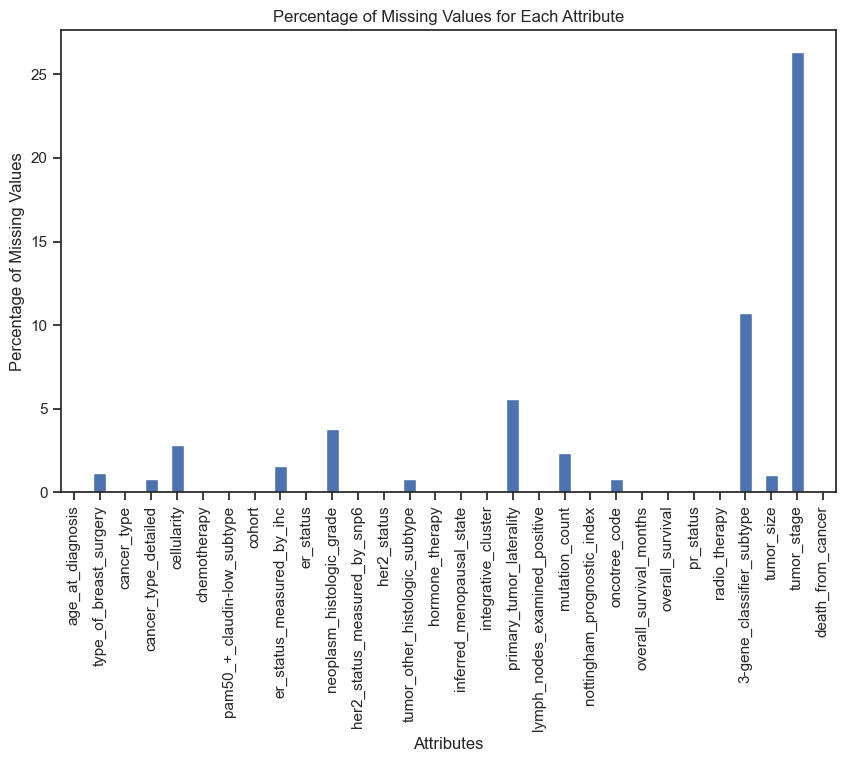

In [61]:
missing_percentage = (df_clinical.isnull().sum() / len(df_clinical)) * 100
plt.figure(figsize=(10, 6))
missing_percentage.plot(kind='bar')
plt.xlabel('Attributes')
plt.ylabel('Percentage of Missing Values')
plt.title('Percentage of Missing Values for Each Attribute')
plt.show()

Getting all the categorical values and their levels, as well as converting other variables to categorical

In [62]:
categorical_variables= ["type_of_breast_surgery","cancer_type","cancer_type_detailed","cellularity","chemotherapy","pam50_+_claudin-low_subtype","cohort","er_status_measured_by_ihc",
"er_status","neoplasm_histologic_grade","her2_status_measured_by_snp6","her2_status","tumor_other_histologic_subtype","hormone_therapy","inferred_menopausal_state","integrative_cluster",
"primary_tumor_laterality","oncotree_code","overall_survival","pr_status","radio_therapy","3-gene_classifier_subtype","tumor_stage","death_from_cancer"]
for i in categorical_variables:
    df_clinical[i] =df_clinical[i].astype("category")
print(df_clinical.dtypes)

age_at_diagnosis                   float64
type_of_breast_surgery            category
cancer_type                       category
cancer_type_detailed              category
cellularity                       category
chemotherapy                      category
pam50_+_claudin-low_subtype       category
cohort                            category
er_status_measured_by_ihc         category
er_status                         category
neoplasm_histologic_grade         category
her2_status_measured_by_snp6      category
her2_status                       category
tumor_other_histologic_subtype    category
hormone_therapy                   category
inferred_menopausal_state         category
integrative_cluster               category
primary_tumor_laterality          category
lymph_nodes_examined_positive      float64
mutation_count                     float64
nottingham_prognostic_index        float64
oncotree_code                     category
overall_survival_months            float64
overall_sur

In [63]:
for i in categorical_variables:
    unique_values = df_clinical[i].unique()
    print(f"Column: {i}\nUnique Values: {unique_values}\n")

Column: type_of_breast_surgery
Unique Values: ['MASTECTOMY', 'BREAST CONSERVING', NaN]
Categories (2, object): ['BREAST CONSERVING', 'MASTECTOMY']

Column: cancer_type
Unique Values: ['Breast Cancer', 'Breast Sarcoma']
Categories (2, object): ['Breast Cancer', 'Breast Sarcoma']

Column: cancer_type_detailed
Unique Values: ['Breast Invasive Ductal Carcinoma', 'Breast Mixed Ductal and Lobular Carcinoma', 'Breast Invasive Lobular Carcinoma', 'Breast Invasive Mixed Mucinous Carcinoma', 'Breast', NaN, 'Metaplastic Breast Cancer']
Categories (6, object): ['Breast', 'Breast Invasive Ductal Carcinoma', 'Breast Invasive Lobular Carcinoma', 'Breast Invasive Mixed Mucinous Carcinoma', 'Breast Mixed Ductal and Lobular Carcinoma', 'Metaplastic Breast Cancer']

Column: cellularity
Unique Values: [NaN, 'High', 'Moderate', 'Low']
Categories (3, object): ['High', 'Low', 'Moderate']

Column: chemotherapy
Unique Values: [0, 1]
Categories (2, int64): [0, 1]

Column: pam50_+_claudin-low_subtype
Unique Valu

C:\Users\mdaum\AppData\Local\Temp\ipykernel_12896\1896215383.py:3: FutureWarning: Index.ravel returning ndarray is deprecated; in a future version this will return a view on self.
  print(f"Column: {i}\nUnique Values: {unique_values}\n")


Value counts for column 'type_of_breast_surgery':
+---+-------------------+-------+
|   |     Category      | Count |
+---+-------------------+-------+
| 0 |    MASTECTOMY     | 1127  |
| 1 | BREAST CONSERVING |  755  |
+---+-------------------+-------+



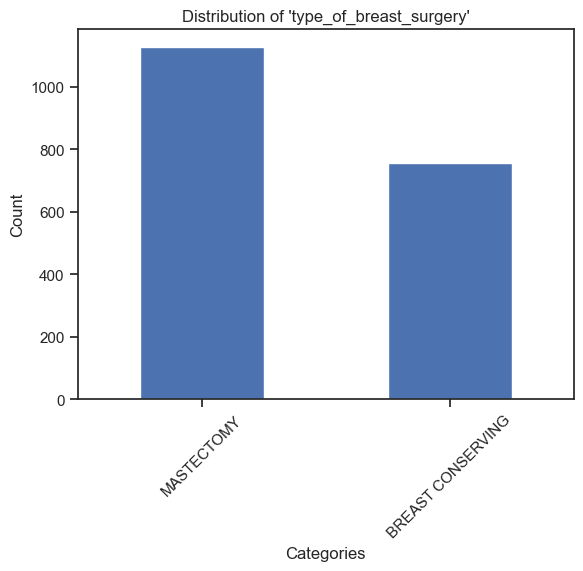

Value counts for column 'cancer_type':
+---+----------------+-------+
|   |    Category    | Count |
+---+----------------+-------+
| 0 | Breast Cancer  | 1903  |
| 1 | Breast Sarcoma |   1   |
+---+----------------+-------+



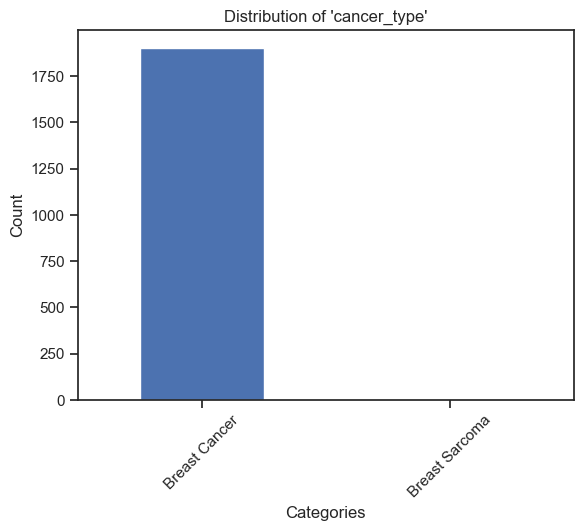

Value counts for column 'cancer_type_detailed':
+---+-------------------------------------------+-------+
|   |                 Category                  | Count |
+---+-------------------------------------------+-------+
| 0 |     Breast Invasive Ductal Carcinoma      | 1500  |
| 1 | Breast Mixed Ductal and Lobular Carcinoma |  207  |
| 2 |     Breast Invasive Lobular Carcinoma     |  142  |
| 3 | Breast Invasive Mixed Mucinous Carcinoma  |  22   |
| 4 |                  Breast                   |  17   |
| 5 |         Metaplastic Breast Cancer         |   1   |
+---+-------------------------------------------+-------+



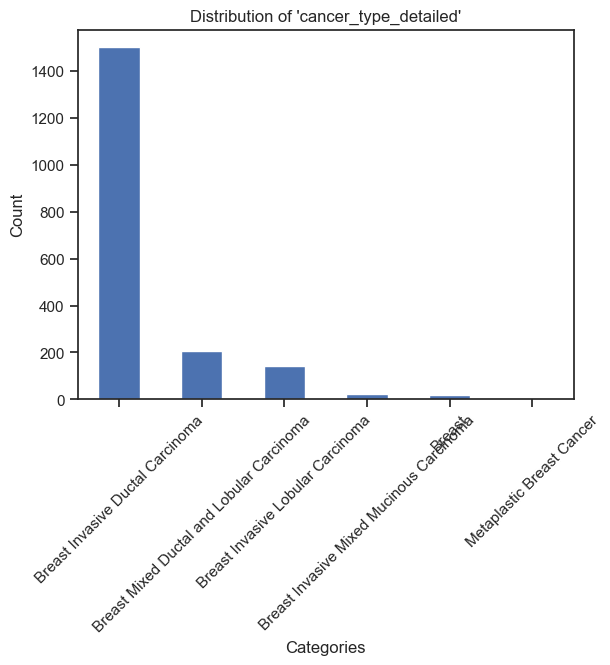

Value counts for column 'cellularity':
+---+----------+-------+
|   | Category | Count |
+---+----------+-------+
| 0 |   High   |  939  |
| 1 | Moderate |  711  |
| 2 |   Low    |  200  |
+---+----------+-------+



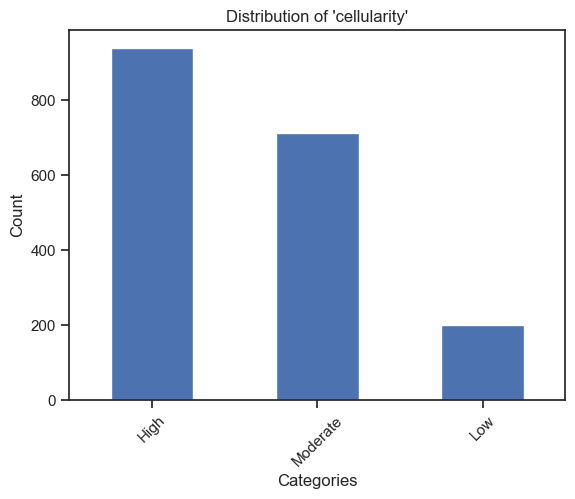

Value counts for column 'chemotherapy':
+---+----------+-------+
|   | Category | Count |
+---+----------+-------+
| 0 |    0     | 1508  |
| 1 |    1     |  396  |
+---+----------+-------+



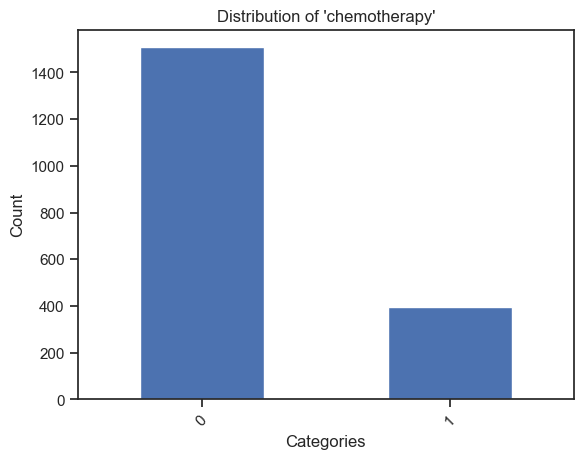

Value counts for column 'pam50_+_claudin-low_subtype':
+---+-------------+-------+
|   |  Category   | Count |
+---+-------------+-------+
| 0 |    LumA     |  679  |
| 1 |    LumB     |  461  |
| 2 |    Her2     |  220  |
| 3 |    Basal    |  199  |
| 4 | claudin-low |  199  |
| 5 |   Normal    |  140  |
| 6 |     NC      |   6   |
+---+-------------+-------+



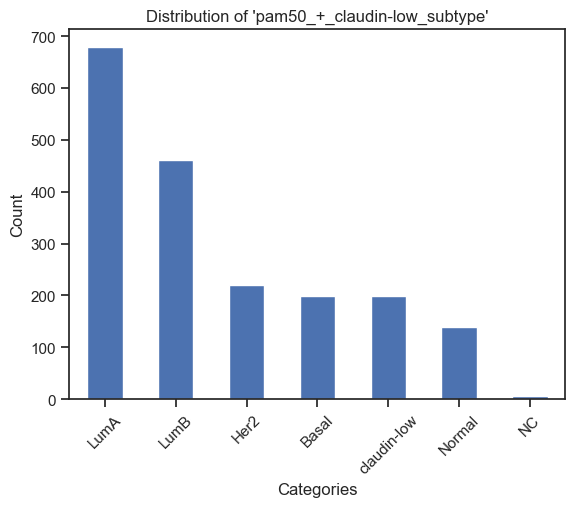

Value counts for column 'cohort':
+---+----------+-------+
|   | Category | Count |
+---+----------+-------+
| 0 |   3.0    | 734.0 |
| 1 |   1.0    | 481.0 |
| 2 |   2.0    | 286.0 |
| 3 |   4.0    | 236.0 |
| 4 |   5.0    | 167.0 |
+---+----------+-------+



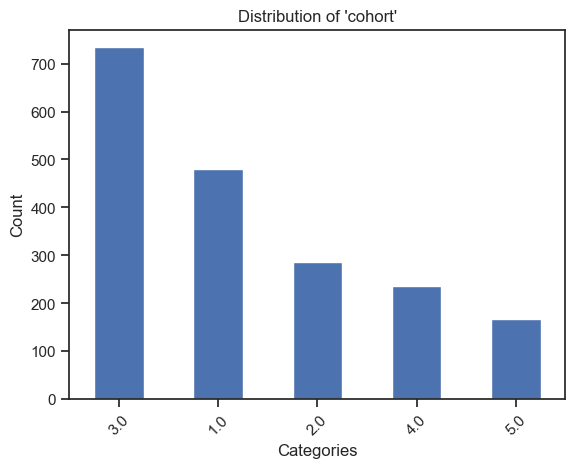

Value counts for column 'er_status_measured_by_ihc':
+---+----------+-------+
|   | Category | Count |
+---+----------+-------+
| 0 | Positve  | 1445  |
| 1 | Negative |  429  |
+---+----------+-------+



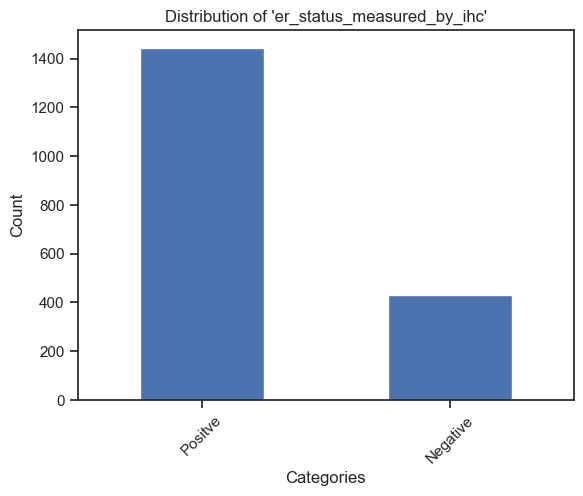

Value counts for column 'er_status':
+---+----------+-------+
|   | Category | Count |
+---+----------+-------+
| 0 | Positive | 1459  |
| 1 | Negative |  445  |
+---+----------+-------+



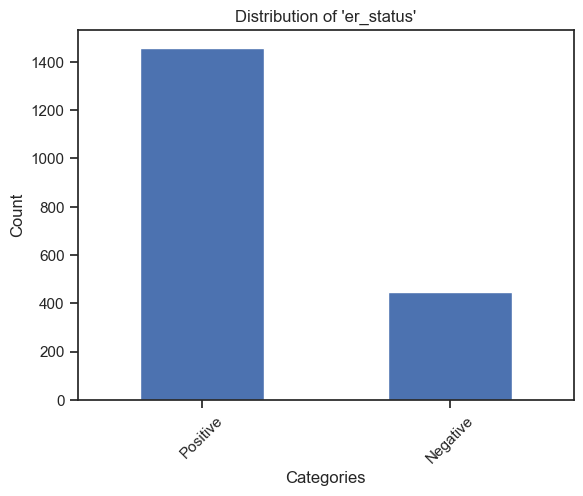

Value counts for column 'neoplasm_histologic_grade':
+---+----------+-------+
|   | Category | Count |
+---+----------+-------+
| 0 |   3.0    | 927.0 |
| 1 |   2.0    | 740.0 |
| 2 |   1.0    | 165.0 |
+---+----------+-------+



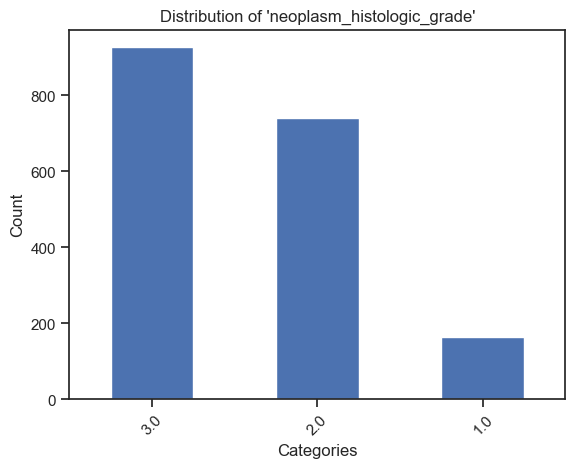

Value counts for column 'her2_status_measured_by_snp6':
+---+----------+-------+
|   | Category | Count |
+---+----------+-------+
| 0 | NEUTRAL  | 1383  |
| 1 |   GAIN   |  417  |
| 2 |   LOSS   |  100  |
| 3 |  UNDEF   |   4   |
+---+----------+-------+



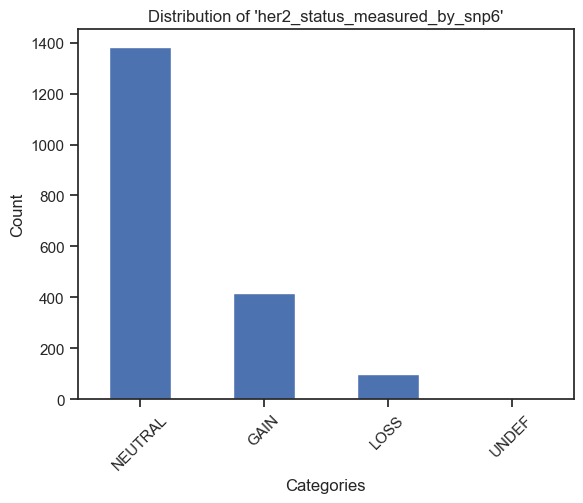

Value counts for column 'her2_status':
+---+----------+-------+
|   | Category | Count |
+---+----------+-------+
| 0 | Negative | 1668  |
| 1 | Positive |  236  |
+---+----------+-------+



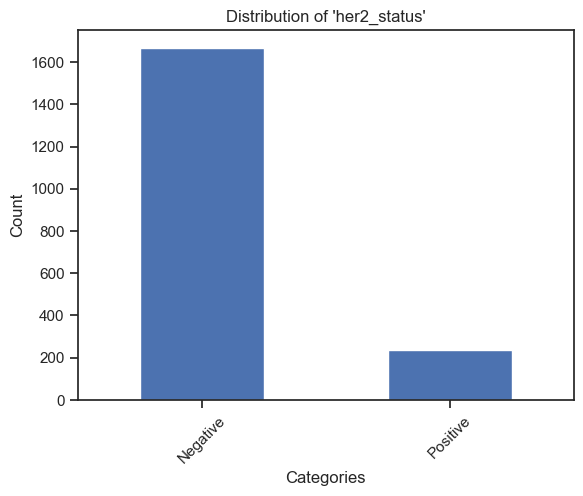

Value counts for column 'tumor_other_histologic_subtype':
+---+---------------------+-------+
|   |      Category       | Count |
+---+---------------------+-------+
| 0 |     Ductal/NST      | 1454  |
| 1 |        Mixed        |  207  |
| 2 |       Lobular       |  142  |
| 3 |      Medullary      |  25   |
| 4 |      Mucinous       |  22   |
| 5 | Tubular/ cribriform |  21   |
| 6 |        Other        |  17   |
| 7 |     Metaplastic     |   1   |
+---+---------------------+-------+



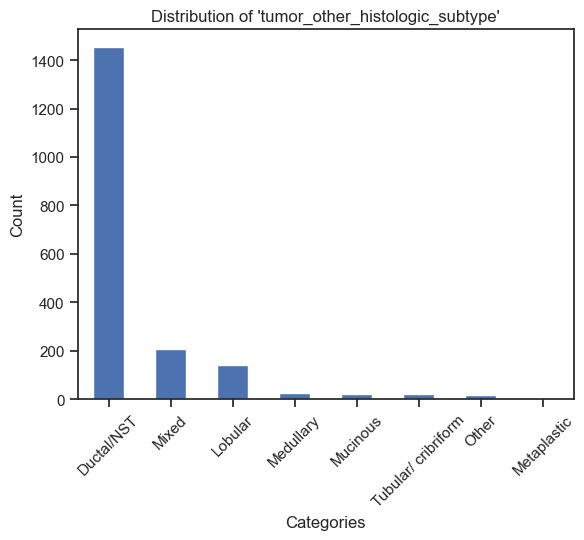

Value counts for column 'hormone_therapy':
+---+----------+-------+
|   | Category | Count |
+---+----------+-------+
| 0 |    1     | 1174  |
| 1 |    0     |  730  |
+---+----------+-------+



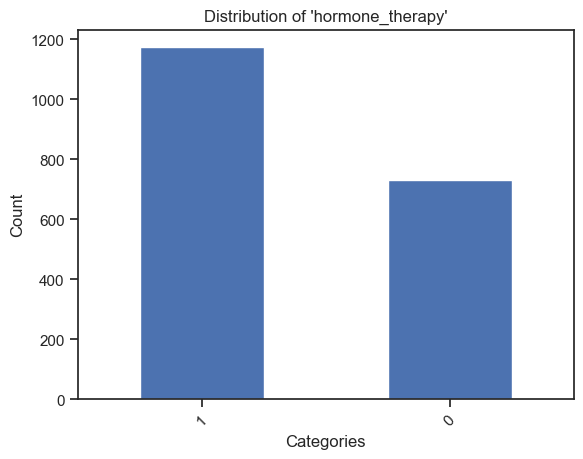

Value counts for column 'inferred_menopausal_state':
+---+----------+-------+
|   | Category | Count |
+---+----------+-------+
| 0 |   Post   | 1493  |
| 1 |   Pre    |  411  |
+---+----------+-------+



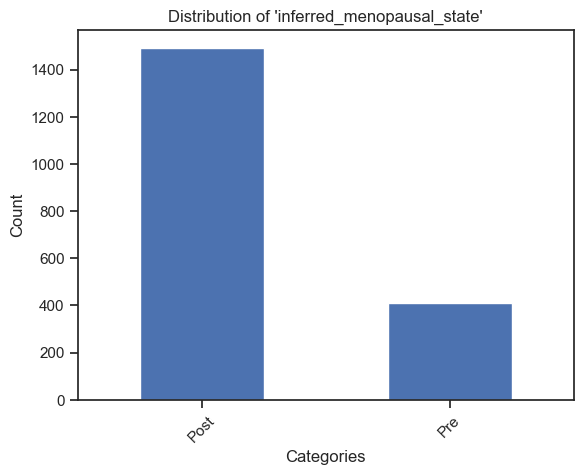

Value counts for column 'integrative_cluster':
+----+----------+-------+
|    | Category | Count |
+----+----------+-------+
| 0  |    8     |  289  |
| 1  |    3     |  282  |
| 2  |   4ER+   |  244  |
| 3  |    10    |  219  |
| 4  |    5     |  184  |
| 5  |    7     |  182  |
| 6  |    9     |  142  |
| 7  |    1     |  132  |
| 8  |    6     |  84   |
| 9  |   4ER-   |  74   |
| 10 |    2     |  72   |
+----+----------+-------+



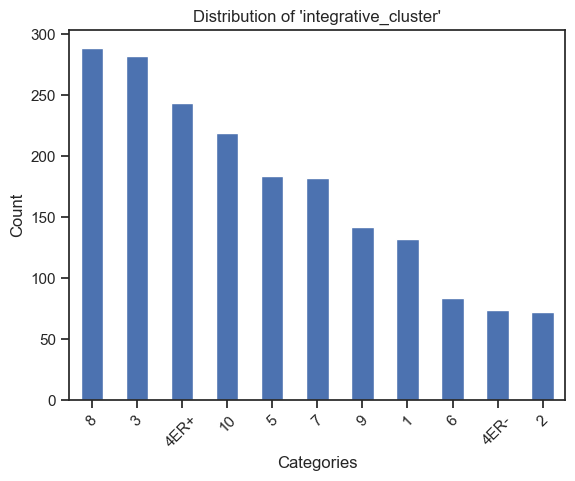

Value counts for column 'primary_tumor_laterality':
+---+----------+-------+
|   | Category | Count |
+---+----------+-------+
| 0 |   Left   |  935  |
| 1 |  Right   |  863  |
+---+----------+-------+



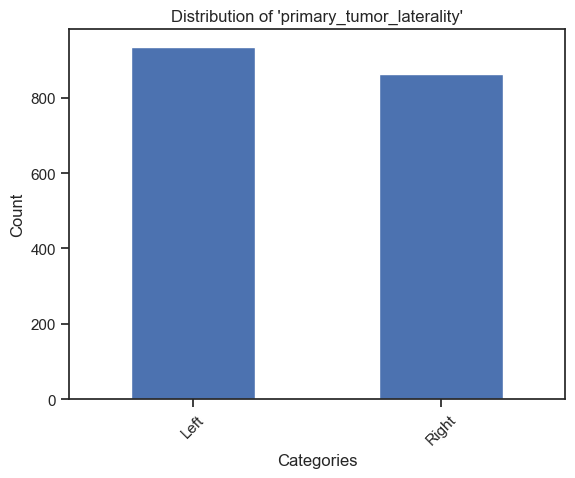

Value counts for column 'oncotree_code':
+---+----------+-------+
|   | Category | Count |
+---+----------+-------+
| 0 |   IDC    | 1500  |
| 1 |   MDLC   |  207  |
| 2 |   ILC    |  142  |
| 3 |   IMMC   |  22   |
| 4 |  BREAST  |  17   |
| 5 |   MBC    |   1   |
+---+----------+-------+



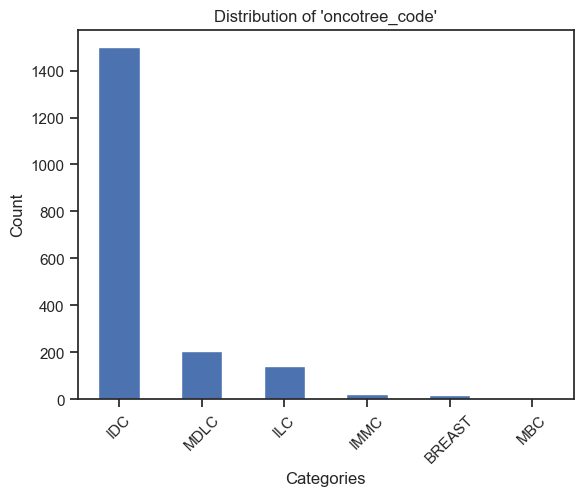

Value counts for column 'overall_survival':
+---+----------+-------+
|   | Category | Count |
+---+----------+-------+
| 0 |    0     | 1103  |
| 1 |    1     |  801  |
+---+----------+-------+



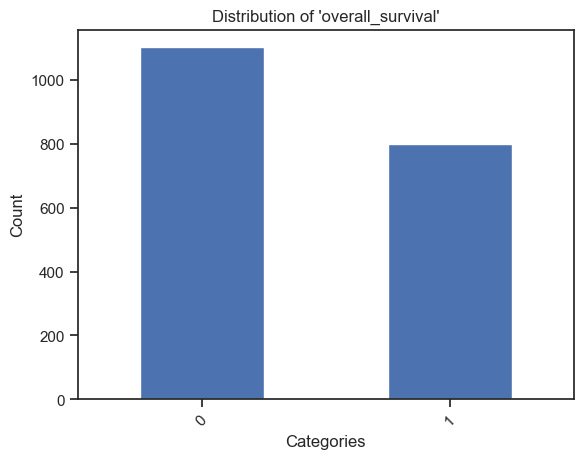

Value counts for column 'pr_status':
+---+----------+-------+
|   | Category | Count |
+---+----------+-------+
| 0 | Positive | 1009  |
| 1 | Negative |  895  |
+---+----------+-------+



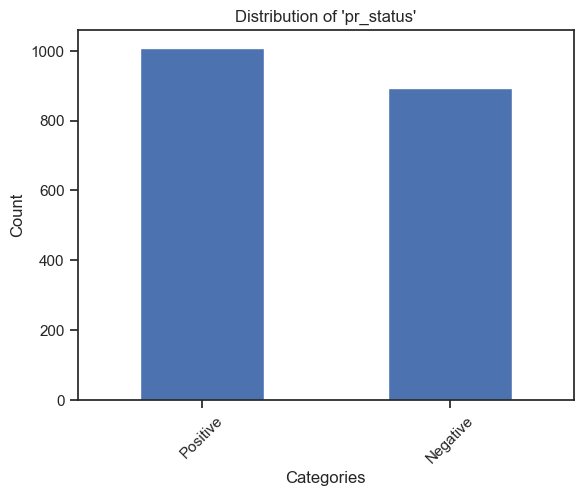

Value counts for column 'radio_therapy':
+---+----------+-------+
|   | Category | Count |
+---+----------+-------+
| 0 |    1     | 1137  |
| 1 |    0     |  767  |
+---+----------+-------+



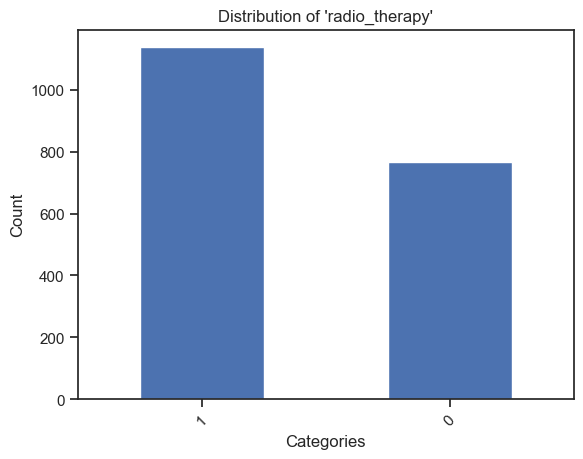

Value counts for column '3-gene_classifier_subtype':
+---+-----------------------+-------+
|   |       Category        | Count |
+---+-----------------------+-------+
| 0 | ER+/HER2- Low Prolif  |  619  |
| 1 | ER+/HER2- High Prolif |  603  |
| 2 |       ER-/HER2-       |  290  |
| 3 |         HER2+         |  188  |
+---+-----------------------+-------+



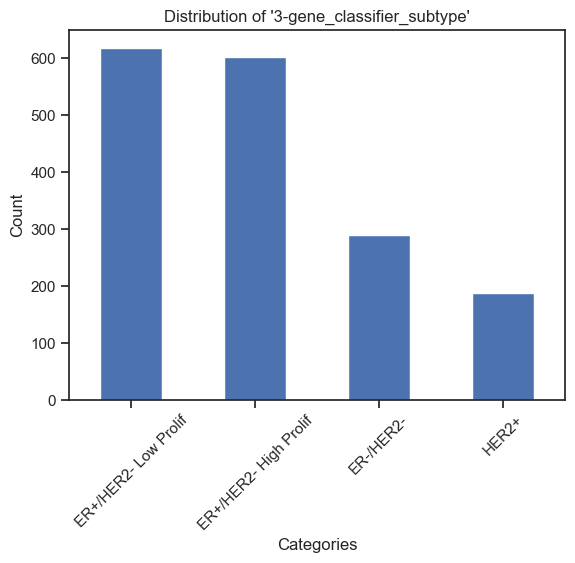

Value counts for column 'tumor_stage':
+---+----------+-------+
|   | Category | Count |
+---+----------+-------+
| 0 |   2.0    | 800.0 |
| 1 |   1.0    | 475.0 |
| 2 |   3.0    | 115.0 |
| 3 |   4.0    |  9.0  |
| 4 |   0.0    |  4.0  |
+---+----------+-------+



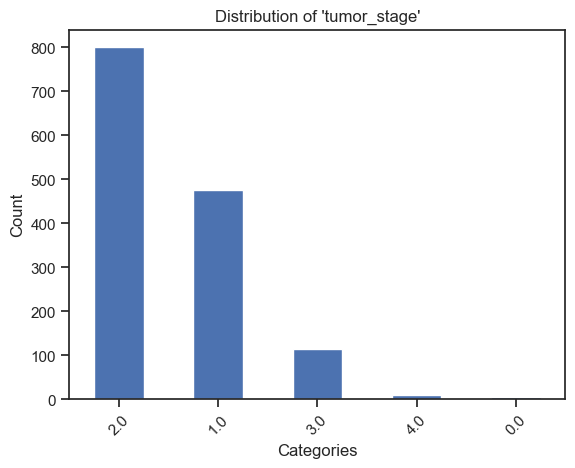

Value counts for column 'death_from_cancer':
+---+----------------------+-------+
|   |       Category       | Count |
+---+----------------------+-------+
| 0 |        Living        |  801  |
| 1 |   Died of Disease    |  622  |
| 2 | Died of Other Causes |  480  |
+---+----------------------+-------+



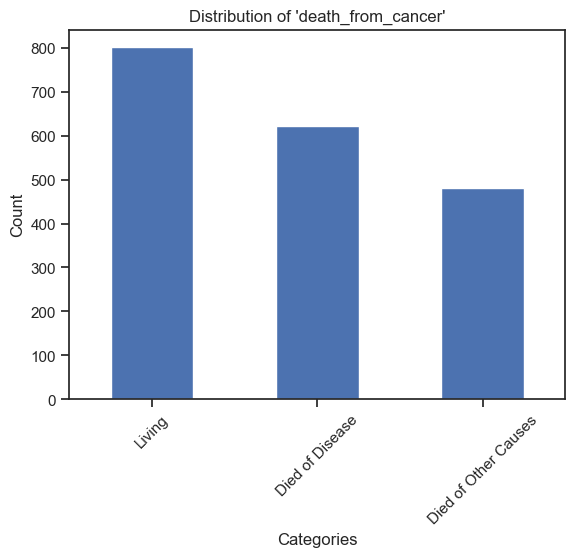

In [64]:
for i in categorical_variables:
    value_counts = df_clinical[i].value_counts()
    print(f"Value counts for column '{i}':")
    print(tabulate.tabulate(value_counts.reset_index(), headers=["Category", "Count"], tablefmt="pretty"))
    print()
    plt.figure()
    value_counts.plot(kind='bar')
    plt.title(f"Distribution of '{i}'")
    plt.xlabel("Categories")
    plt.ylabel("Count")
    plt.xticks(rotation=45)
    plt.show()

summary statistics for numerical variables in clinical attributes.


In [65]:

df_clinical.describe()

,age_at_diagnosis,lymph_nodes_examined_positive,mutation_count,nottingham_prognostic_index,overall_survival_months,tumor_size
count,1904.000000,1904.000000,1859.000000,1904.000000,1904.000000,1884.000000
mean,61.087054,2.002101,5.697687,4.033019,125.121324,26.238726
std,12.978711,4.079993,4.058778,1.144492,76.334148,15.160976
min,21.930000,0.000000,1.000000,1.000000,0.000000,1.000000
25%,51.375000,0.000000,3.000000,3.046000,60.825000,17.000000
50%,61.770000,0.000000,5.000000,4.042000,115.616667,23.000000
75%,70.592500,2.000000,7.000000,5.040250,184.716667,30.000000
max,96.290000,45.000000,80.000000,6.360000,355.200000,182.000000


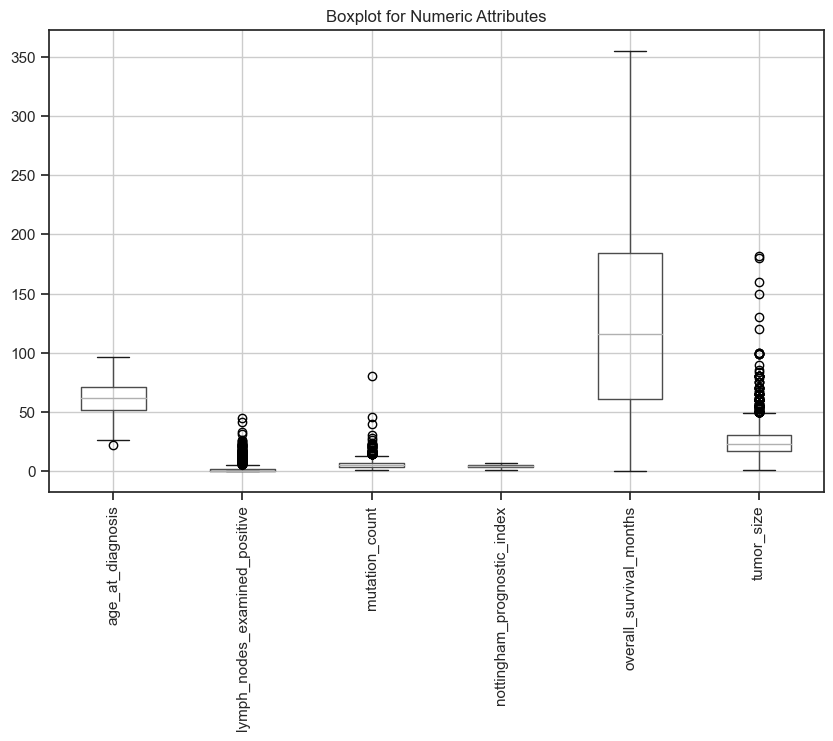

In [66]:

plt.figure(figsize=(10, 6))
df_clinical.boxplot()
plt.xticks(rotation=90)
plt.title('Boxplot for Numeric Attributes')
plt.show()

Histograms for numerical variables to see the distribution

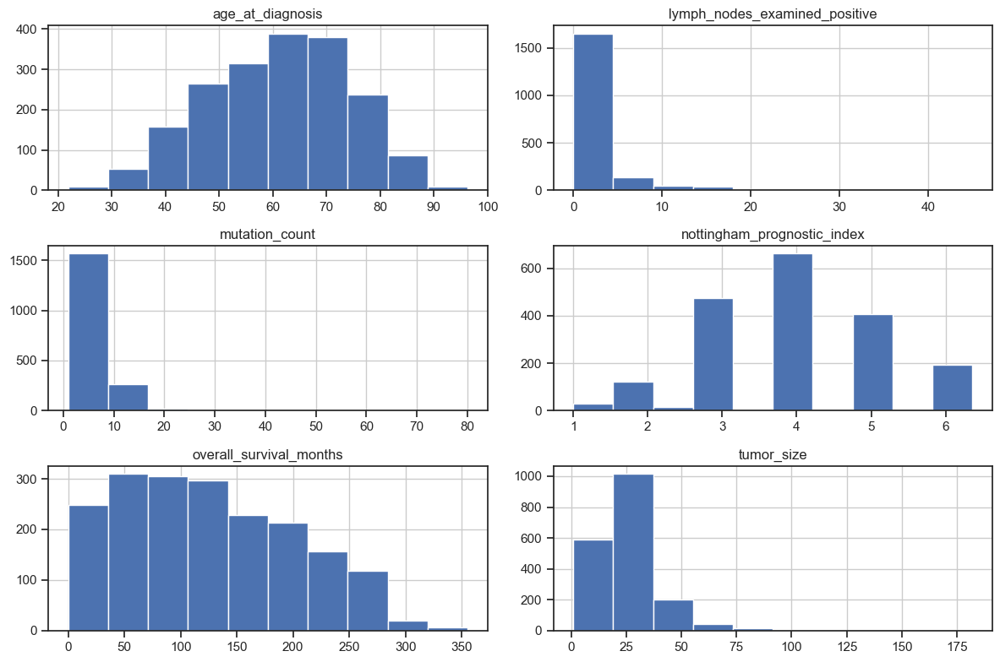

In [67]:
# Plotting histograms
df_clinical.hist(figsize=(12, 8))
plt.tight_layout()
plt.show()

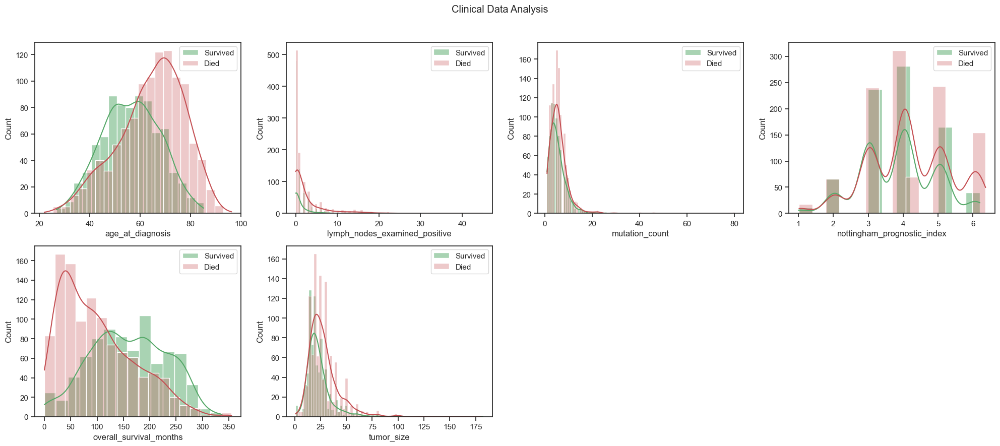

In [68]:
fig = plt.figure(figsize=(20, 25))
j = 0
num_clinical_columns = ['age_at_diagnosis', 'lymph_nodes_examined_positive', 'mutation_count', 'nottingham_prognostic_index', 'overall_survival_months', 'tumor_size']
for i in num_clinical_columns:
    plt.subplot(6, 4, j+1)
    j += 1
    sns.histplot(df_clinical[i][df_clinical['overall_survival'] == 1], color='g', label='Survived', kde=True, alpha=0.5)
    sns.histplot(df_clinical[i][df_clinical['overall_survival'] == 0], color='r', label='Died', kde=True, alpha=0.3)
    plt.legend(loc='best')
fig.suptitle('Clinical Data Analysis')
fig.tight_layout()
fig.subplots_adjust(top=0.95)
plt.show()



Relationship between tumor_size, tumor_stage:
Most survived patient showed lower tumor size as well as tumor-stage indicating early diagnosis as an important factor.

<function matplotlib.pyplot.show(close=None, block=None)>

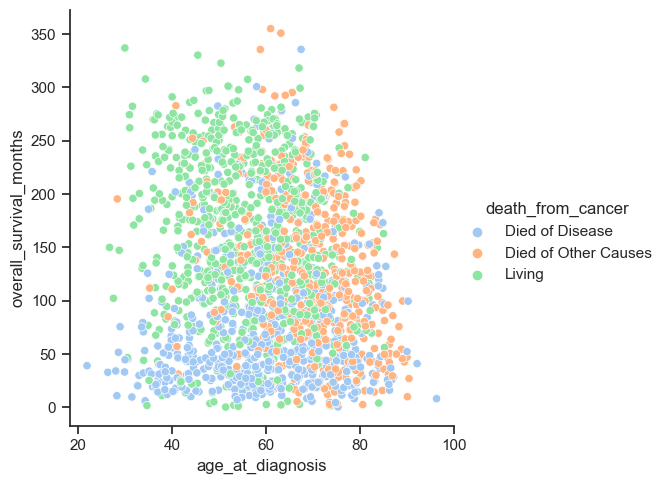

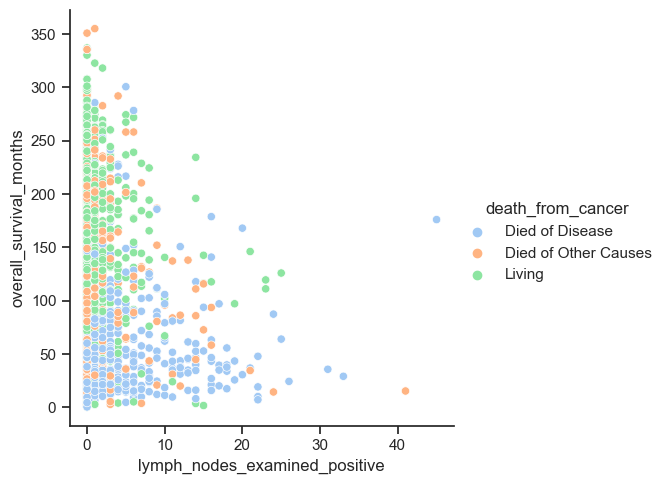

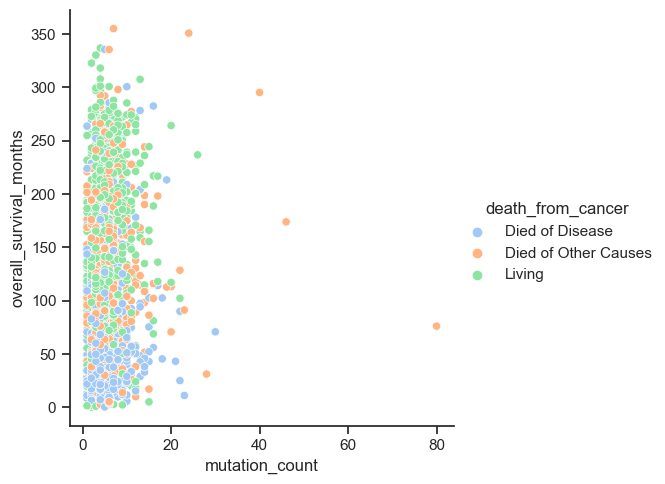

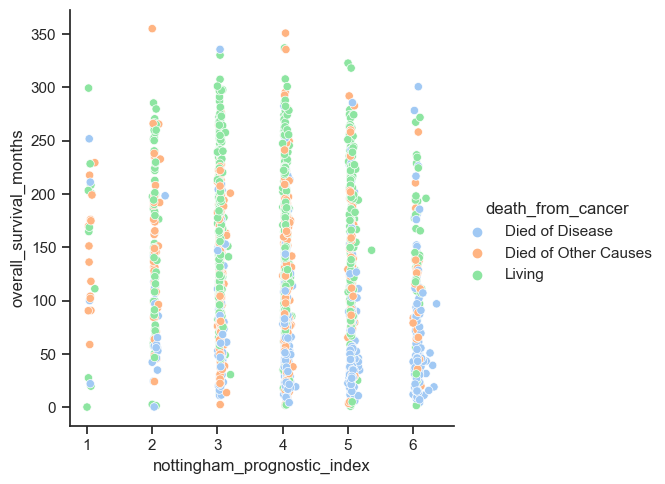

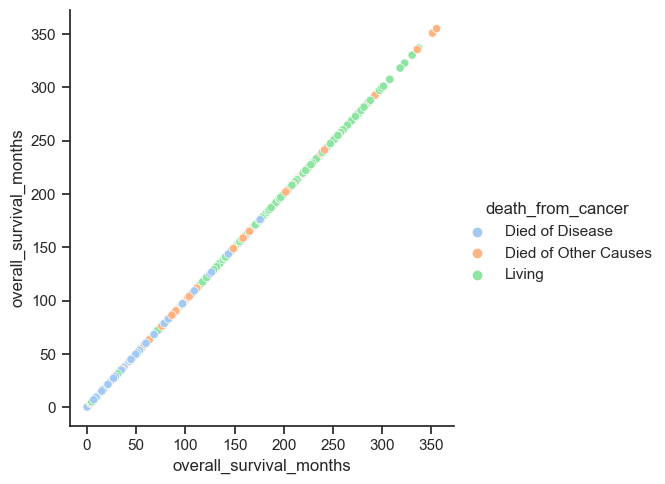

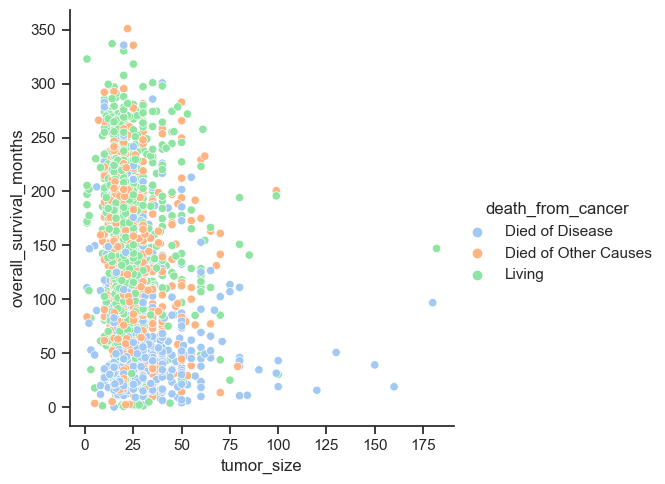

In [69]:
sns.set_palette("pastel")
for variables in num_clinical_columns:
    sns.relplot(data=df_clinical, x=variables, y="overall_survival_months", hue="death_from_cancer")
plt.show

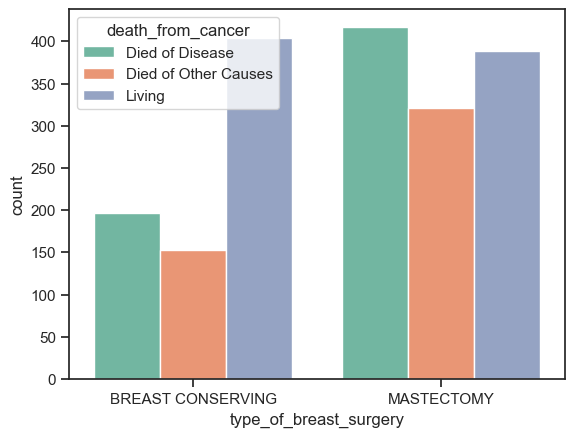

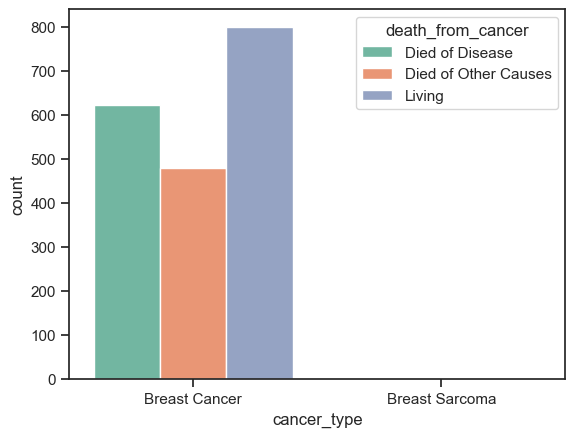

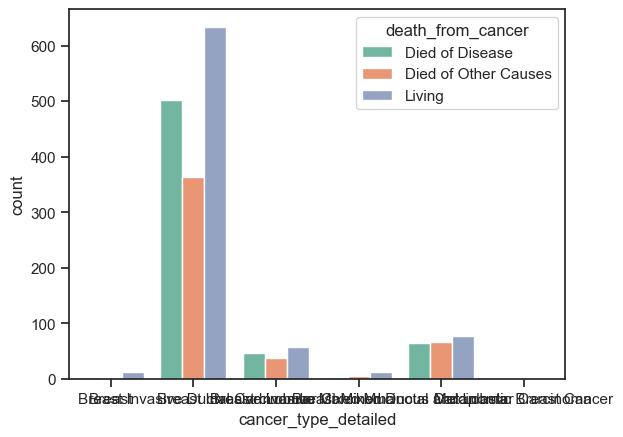

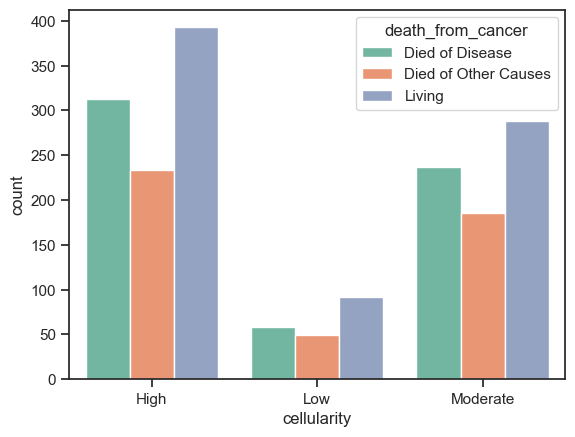

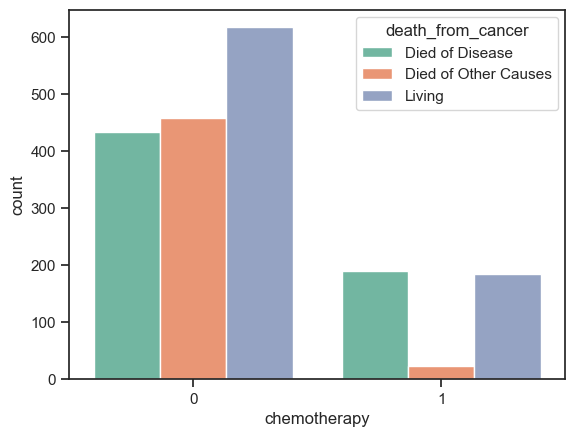

...

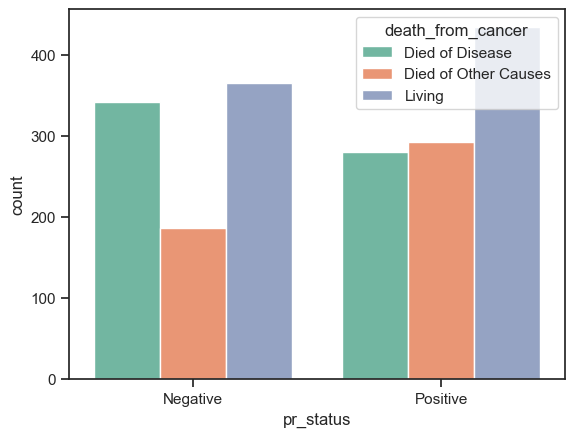

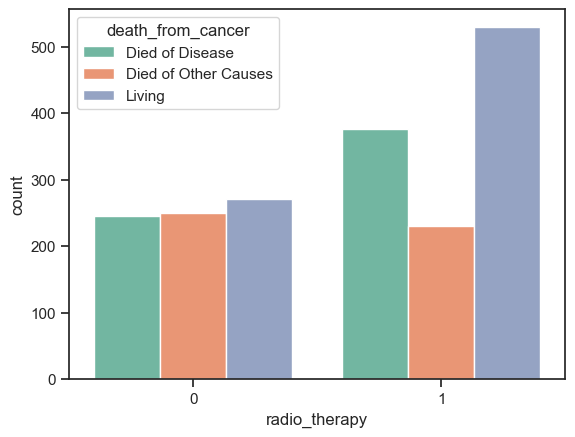

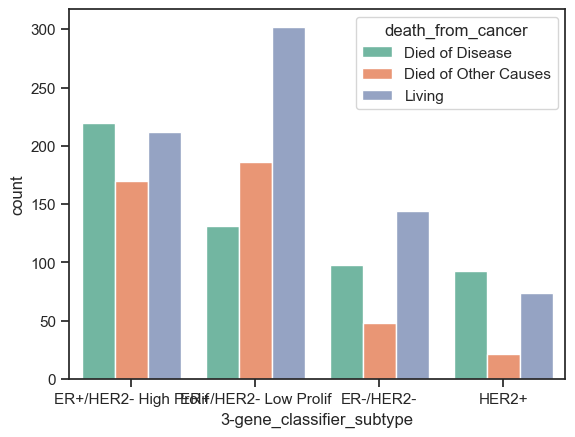

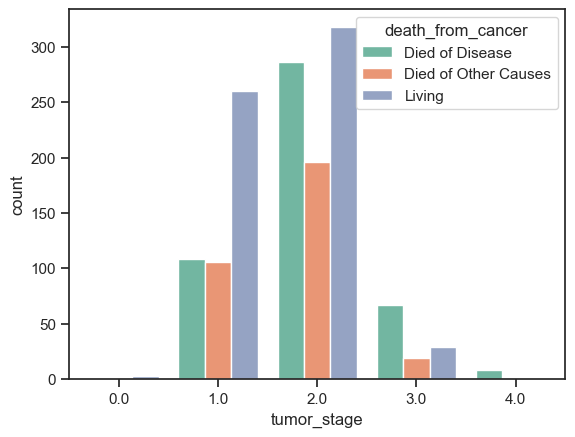

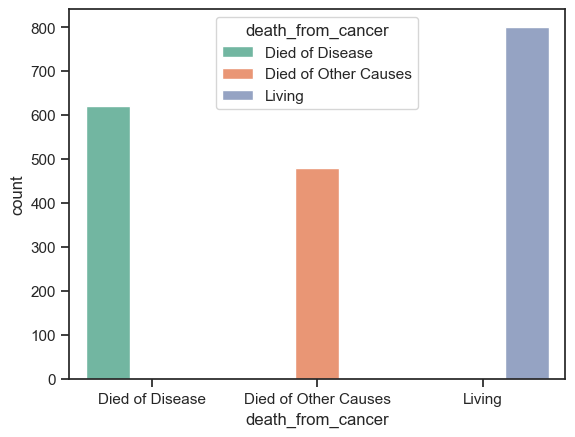

In [70]:

sns.set_palette("Set2")
for variables in categorical_variables:
    sns.countplot(data=df_clinical, x=variables, hue="death_from_cancer")
    plt.show()




    

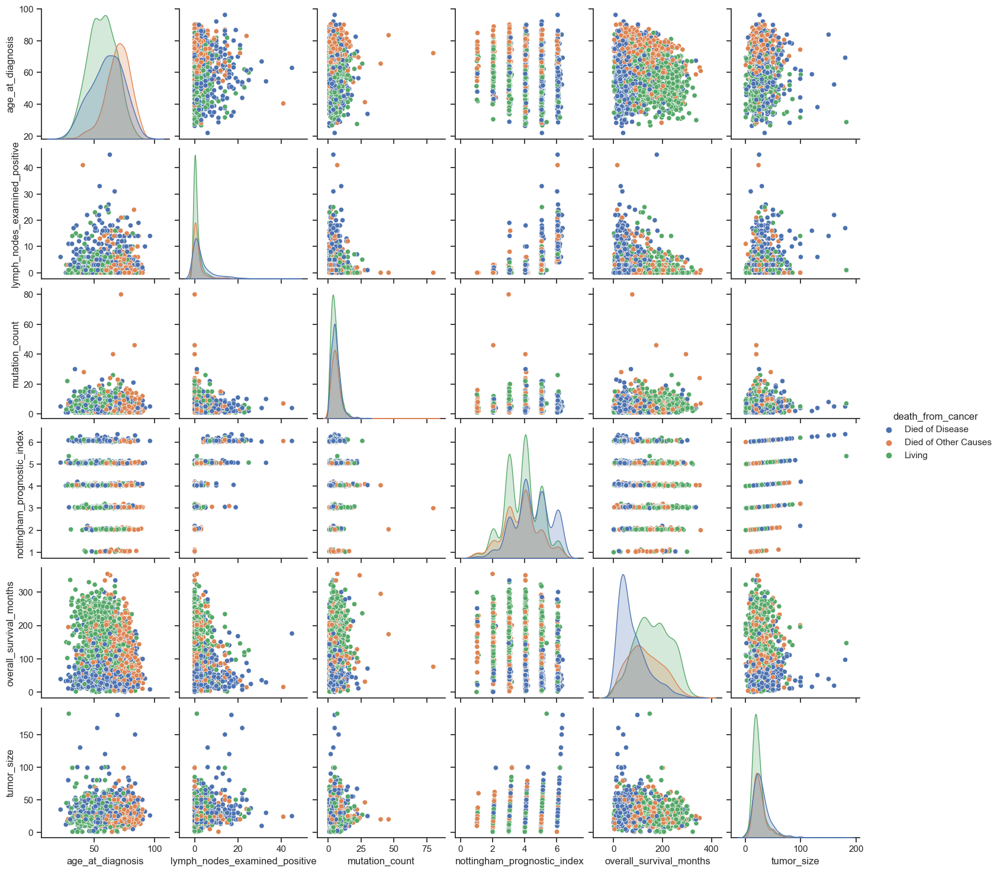

In [71]:
sns.set_theme(style="ticks")

sns.pairplot(df_clinical, hue="death_from_cancer")

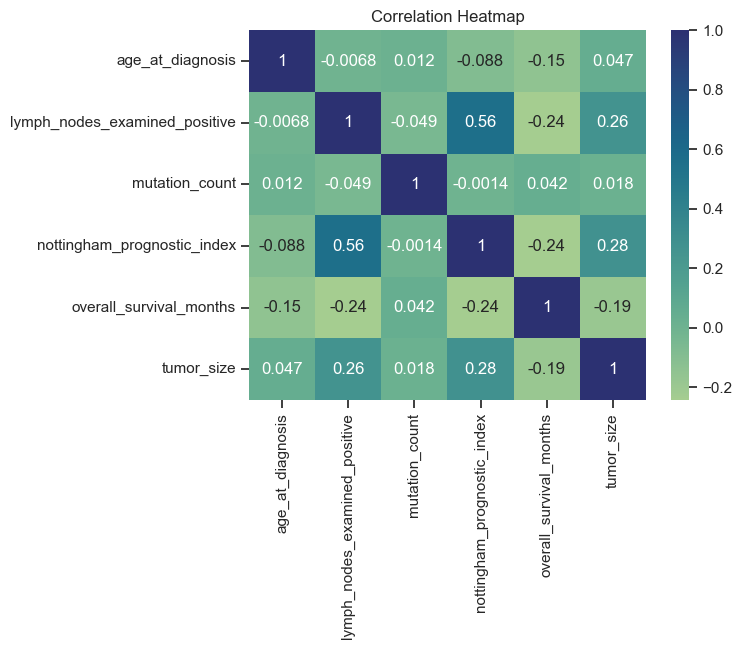

In [72]:
#correlation
correlation_matrix = df_clinical.corr()

# Generate a heatmap of the correlation matrix

sns.heatmap(data=correlation_matrix, annot=True, cmap="crest")

# Set the plot title
plt.title("Correlation Heatmap")

# Show the plot
plt.show()

The Nottingham Prognostic Index (NPI) is a prognostic tool used in breast cancer to assess the likelihood of disease recurrence and predict patient outcomes. It takes into account the following factors:

Tumor Size: The size of the primary tumor is measured in millimeters. Larger tumor size is generally associated with a higher risk of recurrence.

Lymph Node Involvement: It considers whether the cancer has spread to the nearby lymph nodes. The presence of lymph node involvement is associated with a higher risk of recurrence.

Histological Grade: The histological grade is a measure of how closely the tumor resembles normal breast tissue under a microscope. It assesses the level of tumor differentiation. The NPI typically uses a three-tier grading system (Grade 1, 2, or 3) to determine the aggressiveness of the tumor. Higher-grade tumors are associated with a higher risk of recurrence.

The NPI combines these three factors into a single index to provide a prognostic assessment. The formula for calculating the NPI is:

NPI = (0.2 x tumor size) + (0.4 x lymph node status) + (0.6 x histological grade)

In [73]:
print(categorical_variables)
print(df_clinical.columns)


['type_of_breast_surgery', 'cancer_type', 'cancer_type_detailed', 'cellularity', 'chemotherapy', 'pam50_+_claudin-low_subtype', 'cohort', 'er_status_measured_by_ihc', 'er_status', 'neoplasm_histologic_grade', 'her2_status_measured_by_snp6', 'her2_status', 'tumor_other_histologic_subtype', 'hormone_therapy', 'inferred_menopausal_state', 'integrative_cluster', 'primary_tumor_laterality', 'oncotree_code', 'overall_survival', 'pr_status', 'radio_therapy', '3-gene_classifier_subtype', 'tumor_stage', 'death_from_cancer']
Index(['age_at_diagnosis', 'type_of_breast_surgery', 'cancer_type',
       'cancer_type_detailed', 'cellularity', 'chemotherapy',
       'pam50_+_claudin-low_subtype', 'cohort', 'er_status_measured_by_ihc',
       'er_status', 'neoplasm_histologic_grade',
       'her2_status_measured_by_snp6', 'her2_status',
       'tumor_other_histologic_subtype', 'hormone_therapy',
       'inferred_menopausal_state', 'integrative_cluster',
       'primary_tumor_laterality', 'lymph_nodes_ex

In [74]:
cat_df=df_clinical.drop(columns= num_clinical_columns)
cat_df.head     

<bound method NDFrame.head of      type_of_breast_surgery    cancer_type  \
0                MASTECTOMY  Breast Cancer   
1         BREAST CONSERVING  Breast Cancer   
2                MASTECTOMY  Breast Cancer   
3                MASTECTOMY  Breast Cancer   
4                MASTECTOMY  Breast Cancer   
...                     ...            ...   
1899      BREAST CONSERVING  Breast Cancer   
1900             MASTECTOMY  Breast Cancer   
1901             MASTECTOMY  Breast Cancer   
1902             MASTECTOMY  Breast Cancer   
1903      BREAST CONSERVING  Breast Cancer   

                           cancer_type_detailed cellularity chemotherapy  \
0              Breast Invasive Ductal Carcinoma         NaN            0   
1              Breast Invasive Ductal Carcinoma        High            0   
2              Breast Invasive Ductal Carcinoma        High            1   
3     Breast Mixed Ductal and Lobular Carcinoma    Moderate            1   
4     Breast Mixed Ductal and Lobular

In [75]:
report = pandas_profiling.ProfileReport(df_clinical)

report.to_file('report.html')
report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

creating a new data framefor all the treatments, taking the type_of breast surgery as mainly as masectomy.

In [76]:

treatmentList = ["type_of_breast_surgery", "chemotherapy", "hormone_therapy", "radio_therapy"] 
dfTreatments = df_clinical[treatmentList].copy()  # Create a copy of the DataFrame

dfTreatments.loc[:, "type_of_breast_surgery"] = dfTreatments["type_of_breast_surgery"].apply(lambda x: 1 if "MASTECTOMY" in str(x) else 0)
dfTreatments.head()


,type_of_breast_surgery,chemotherapy,hormone_therapy,radio_therapy
0,1,0,1,1
1,0,0,1,1
2,1,1,1,0
3,1,1,1,1
4,1,1,1,1


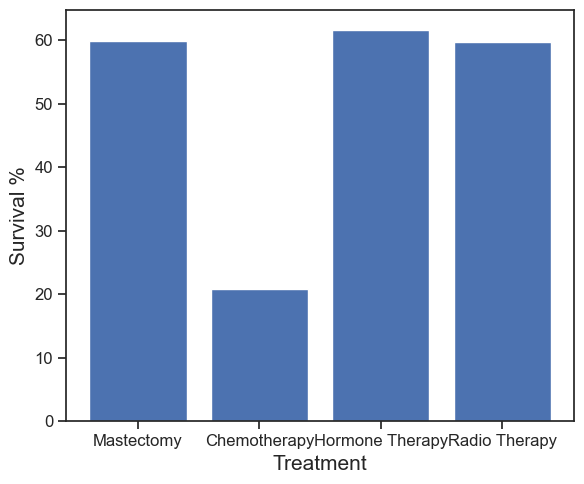

In [77]:
#Get the overall survival % in 100%. 
dfTreatments.rename(columns={"type_of_breast_surgery": "Mastectomy", "chemotherapy": "Chemotherapy", "hormone_therapy": "Hormone Therapy", "radio_therapy": "Radio Therapy"}, inplace=True)
mastectomyCounts = (dfTreatments["Mastectomy"].value_counts()[1]/dfTreatments["Mastectomy"].value_counts().sum())*100
chemoCounts = (dfTreatments["Chemotherapy"].value_counts()[1]/dfTreatments["Chemotherapy"].value_counts().sum())*100
hormoneCounts = (dfTreatments["Hormone Therapy"].value_counts()[1]/dfTreatments["Hormone Therapy"].value_counts().sum())*100
radioCounts = (dfTreatments["Radio Therapy"].value_counts()[1]/dfTreatments["Radio Therapy"].value_counts().sum())*100

#Dictionary of the survival % for each treatment 
treatmentSurvivalDict = {'Mastectomy': mastectomyCounts, 'Chemotherapy': chemoCounts, 'Hormone Therapy':hormoneCounts, 'Radio Therapy': radioCounts}
#Plot of each treatment 
plt.figure(figsize=(6,5))
plt.bar(list(treatmentSurvivalDict.keys()), list(treatmentSurvivalDict.values()))
plt.xlabel("Treatment", fontsize=15)
plt.ylabel("Survival %", fontsize=15)
plt.xticks(size=12)
plt.yticks(size=12)

plt.tight_layout()

In [78]:
report_treatment = pandas_profiling.ProfileReport(dfTreatments)

report_treatment.to_file('report.html')
report_treatment

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Genetic Data analysis

In [79]:
df_genetic =data.iloc[:, 31:520]
df_genetic.head()


,brca1,brca2,palb2,pten,tp53,atm,cdh1,chek2,nbn,nf1,...,srd5a1,srd5a2,srd5a3,st7,star,tnk2,tulp4,ugt2b15,ugt2b17,ugt2b7
0,-1.3990,-0.5738,-1.6217,1.4524,0.3504,1.1517,0.0348,0.1266,-0.8361,-0.8578,...,-1.1877,-0.0194,-1.6345,-0.2142,-0.5698,-1.1741,-1.4779,-0.5954,-0.8847,-0.3354
1,-1.3800,0.2777,-1.2154,0.5296,-0.0136,-0.2659,1.3594,0.7961,0.5419,-2.6059,...,-0.4412,0.4534,0.4068,0.7634,0.0231,0.9121,-0.9538,-0.2264,0.5398,-0.8920
2,0.0670,-0.8426,0.2114,-0.3326,0.5141,-0.0803,1.1398,0.4187,-0.4030,-1.1305,...,-0.5381,0.0668,0.8344,1.7227,0.4024,-3.7172,-1.5538,1.3701,-0.1078,0.3655
3,0.6744,-0.5428,-1.6592,0.6369,1.6708,-0.8880,1.2491,-1.1889,-0.4174,-0.6165,...,-0.5630,-0.7078,0.8228,0.6819,-0.1948,-2.3286,-0.9924,-0.3154,0.2320,-0.4828
4,1.2932,-0.9039,-0.7219,0.2168,0.3484,0.3897,0.9131,0.9356,0.7675,-0.2940,...,-0.5845,-0.3544,-1.0150,2.2961,0.1817,-0.1572,0.0427,5.0048,3.8476,1.3223


In [80]:
df_genetic.describe()

,brca1,brca2,palb2,pten,tp53,atm,cdh1,chek2,nbn,nf1,...,srd5a1,srd5a2,srd5a3,st7,star,tnk2,tulp4,ugt2b15,ugt2b17,ugt2b7
count,1.904000e+03,1.904000e+03,1.904000e+03,1.904000e+03,1.904000e+03,1.904000e+03,1904.000000,1.904000e+03,1.904000e+03,1904.000000,...,1.904000e+03,1.904000e+03,1.904000e+03,1.904000e+03,1904.000000,1.904000e+03,1.904000e+03,1.904000e+03,1904.000000,1.904000e+03
mean,-6.302521e-07,-4.201681e-07,3.676471e-07,-8.928571e-07,6.302521e-07,-2.100840e-07,0.000002,7.463684e-18,-3.676471e-07,-0.000001,...,4.726891e-07,-3.676471e-07,-9.453782e-07,-1.050420e-07,-0.000002,3.676471e-07,4.726891e-07,7.878151e-07,0.000000,3.731842e-18
std,1.000262e+00,1.000262e+00,1.000263e+00,1.000263e+00,1.000263e+00,1.000262e+00,1.000263,1.000262e+00,1.000263e+00,1.000262,...,1.000263e+00,1.000262e+00,1.000262e+00,1.000263e+00,1.000262,1.000264e+00,1.000262e+00,1.000263e+00,1.000262,1.000262e+00
min,-2.444400e+00,-2.783500e+00,-4.384600e+00,-5.932800e+00,-2.481200e+00,-3.170500e+00,-3.323700,-2.688700e+00,-3.689800e+00,-2.968600,...,-2.120800e+00,-3.364800e+00,-2.719400e+00,-4.982700e+00,-2.981700,-3.833300e+00,-3.609300e+00,-1.166900e+00,-2.112600,-1.051600e+00
25%,-7.198500e-01,-6.994750e-01,-6.798250e-01,-5.586500e-01,-6.661500e-01,-6.602250e-01,-0.458600,-7.385500e-01,-6.667750e-01,-0.683925,...,-6.188500e-01,-6.104750e-01,-6.741750e-01,-6.136750e-01,-0.632900,-6.664750e-01,-7.102000e-01,-5.058250e-01,-0.476200,-7.260000e-01
50%,-1.244500e-01,-5.820000e-02,-2.210000e-02,1.098500e-01,-3.010000e-02,-4.200000e-03,0.115550,-1.311000e-01,-1.445000e-02,-0.054800,...,-2.456500e-01,-4.690000e-02,-1.422500e-01,-5.175000e-02,-0.026650,7.000000e-04,-2.980000e-02,-2.885500e-01,-0.133400,-4.248000e-01
75%,5.532250e-01,6.290000e-01,6.400000e-01,6.426250e-01,6.447500e-01,6.901500e-01,0.649800,5.431250e-01,6.387250e-01,0.668925,...,3.306000e-01,5.144500e-01,5.146000e-01,5.787750e-01,0.590350,6.429000e-01,5.957250e-01,6.022500e-02,0.270375,4.284000e-01
max,4.554200e+00,3.737900e+00,4.615000e+00,3.254100e+00,4.289800e+00,3.824200e+00,2.820900,4.538200e+00,5.371300e+00,6.178600,...,6.534900e+00,1.027030e+01,6.329000e+00,4.571300e+00,12.742300,3.938800e+00,3.833400e+00,1.088490e+01,12.643900,3.284400e+00


In [81]:
df_genetic.isnull().sum().sort_values(ascending = False)


brca1      0
ctnna3     0
ctcf       0
col6a3     0
col22a1    0
          ..
fas        0
erbb4      0
erbb3      0
erbb2      0
ugt2b7     0
Length: 489, dtype: int64

There is no missing value in the genetic data

In [82]:
df_genetic.duplicated().sum

<bound method NDFrame._add_numeric_operations.<locals>.sum of 0       False
1       False
2       False
3       False
4       False
        ...  
1899    False
1900    False
1901    False
1902    False
1903    False
Length: 1904, dtype: bool>

,brca1,brca2,palb2,pten,tp53,atm,cdh1,chek2,nbn,nf1,...,srd5a1,srd5a2,srd5a3,st7,star,tnk2,tulp4,ugt2b15,ugt2b17,ugt2b7
count,489.000000,489.000000,489.000000,489.000000,489.000000,489.000000,489.000000,489.000000,489.000000,489.000000,...,489.000000,489.000000,489.000000,489.000000,489.000000,489.000000,489.000000,489.000000,489.000000,489.000000
mean,-0.006571,0.013869,-0.005872,-0.002427,0.013818,0.002747,-0.001656,0.009968,0.007320,0.002712,...,0.018125,0.011430,0.001804,-0.020586,-0.000068,-0.005989,-0.003457,-0.007162,-0.005544,-0.003346
std,0.139574,0.093777,0.117754,0.149411,0.084464,0.063994,0.108344,0.172324,0.066049,0.128992,...,0.163513,0.068669,0.109627,0.141704,0.061130,0.199393,0.132624,0.088846,0.063859,0.086479
min,-0.385760,-0.183001,-0.327741,-0.431531,-0.164072,-0.119485,-0.290569,-0.389868,-0.156060,-0.319499,...,-0.532074,-0.111486,-0.268865,-0.429136,-0.113223,-0.499819,-0.343154,-0.175743,-0.100506,-0.235125
25%,-0.080025,-0.040886,-0.075807,-0.086695,-0.034468,-0.029982,-0.065388,-0.092348,-0.024894,-0.084552,...,-0.066398,-0.029263,-0.065357,-0.107936,-0.030054,-0.141221,-0.092270,-0.057744,-0.037574,-0.044574
50%,0.000424,0.006065,-0.013443,-0.010629,0.001922,0.000702,0.001076,-0.003569,-0.000857,-0.006604,...,0.009420,0.006715,-0.007465,-0.026250,-0.002572,-0.025948,-0.008117,-0.012390,-0.012095,-0.009097
75%,0.066944,0.057032,0.054143,0.074205,0.055795,0.032613,0.059097,0.106452,0.028234,0.082705,...,0.095988,0.042817,0.061785,0.055382,0.027762,0.122172,0.070488,0.029643,0.014807,0.027191
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


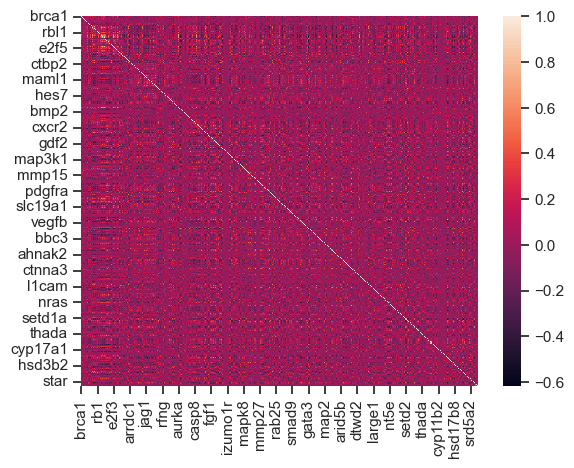

In [83]:
correlation_matrix = df_genetic.corr()
sns.heatmap(correlation_matrix)
correlation_matrix.describe()

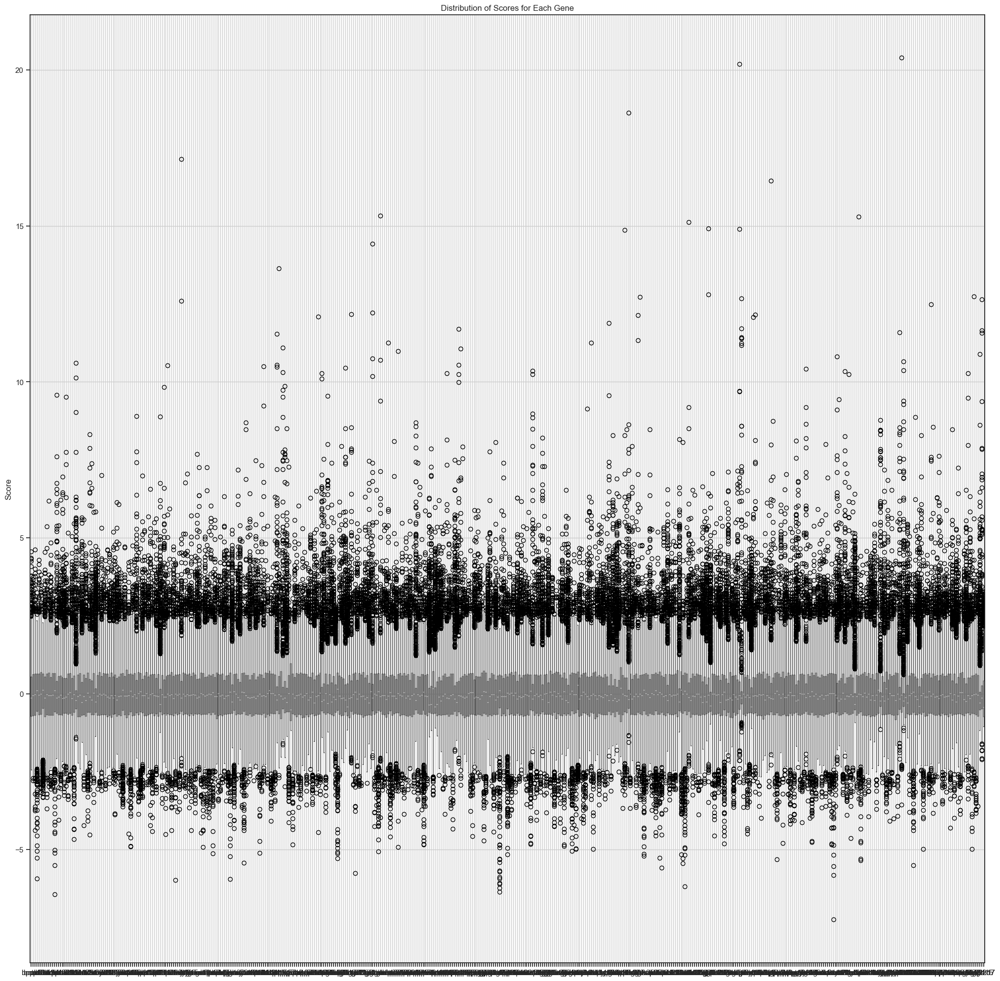

In [84]:
df_genetic.boxplot(figsize=(25,25))

plt.ylabel('Score')
plt.title('Distribution of Scores for Each Gene')
plt.show()

In [85]:
df_genetic.max().sort_values()

mmp11      2.0014
gata3      2.2028
erbb3      2.2761
col6a3     2.2869
mapt       2.3416
           ...   
nrg3      16.4499
hes5      17.1431
tubb4a    18.6351
lipi      20.1984
cyp3a7    20.3950
Length: 489, dtype: float64

In [86]:
df_genetic.min().sort_values()

smarcd1   -7.2432
mlh1      -6.4387
rab25     -6.3503
ctnna1    -6.1880
hdac1     -5.9821
            ...  
muc16     -1.1067
mmp12     -1.0982
ugt2b7    -1.0516
gldc      -0.9667
ttyh1     -0.9160
Length: 489, dtype: float64

In [87]:
# Find the 5 genes with the highest expression levels
top_5_high_expression = df_genetic.mean().nlargest(5)
print("Genes with the highest expression levels:")
print(top_5_high_expression)

# Find the 5 genes with the lowest expression levels
top_5_low_expression = df_genetic.mean().nsmallest(5)
print("Genes with the lowest expression levels:")
print(top_5_low_expression)

Genes with the highest expression levels:
nfkb2     0.000002
rad51c    0.000002
pdgfrb    0.000002
jag1      0.000002
psen2     0.000002
dtype: float64
Genes with the lowest expression levels:
ahnak     -0.000003
cyp17a1   -0.000002
nfkb1     -0.000002
gldc      -0.000002
kmt2d     -0.000002
dtype: float64


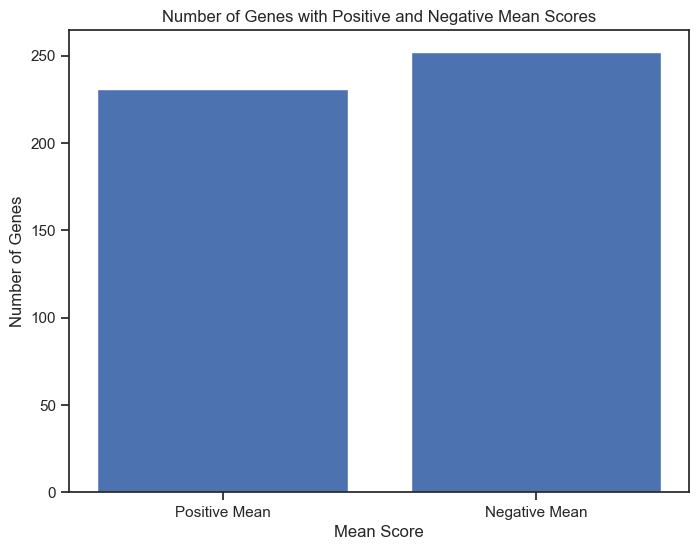

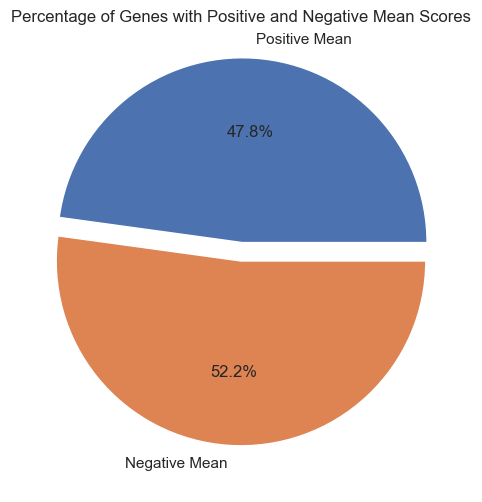

In [88]:
mean_scores = df_genetic.mean()

# Categorize genes based on mean scores
positive_mean_genes = mean_scores[mean_scores > 0].count()
negative_mean_genes = mean_scores[mean_scores < 0].count()

# Create a bar plot
plt.figure(figsize=(8, 6))
plt.bar(['Positive Mean', 'Negative Mean'], [positive_mean_genes, negative_mean_genes])
plt.xlabel('Mean Score')
plt.ylabel('Number of Genes')
plt.title('Number of Genes with Positive and Negative Mean Scores')
plt.show()

# Create a pie plot
labels = ['Positive Mean', 'Negative Mean']
sizes = [positive_mean_genes, negative_mean_genes]
explode = (0.1, 0) 
plt.figure(figsize=(8, 6))
plt.pie(sizes, labels=labels, explode=explode, autopct='%1.1f%%')
plt.title('Percentage of Genes with Positive and Negative Mean Scores')
plt.show()

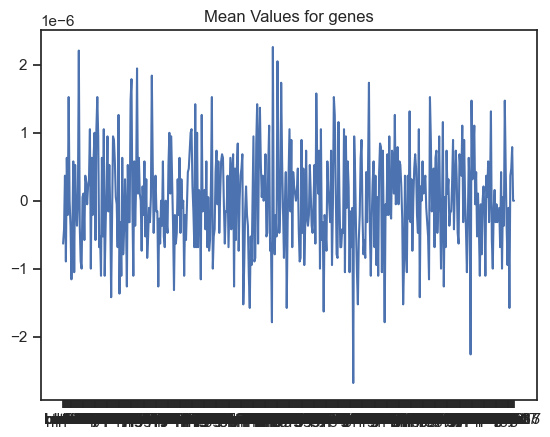

In [89]:

plt.plot(mean_scores)

plt.title('Mean Values for genes')
plt.show()

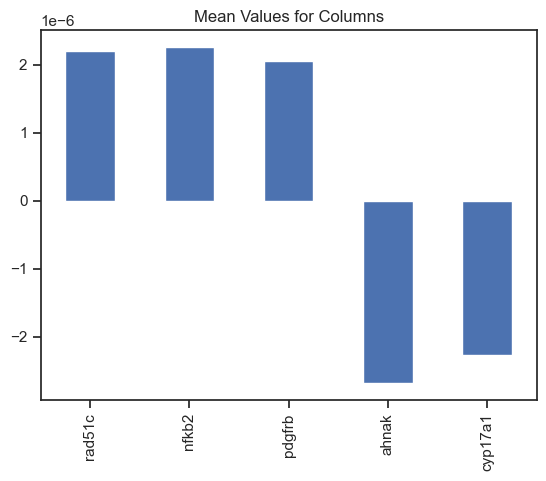

In [90]:
filtered_means = mean_scores[(mean_scores > 2*10**-6) | (mean_scores< -2*10**-6)]

# Step 3: Plot the mean values for the selected columns
filtered_means.plot(kind='bar')

plt.title('Mean Values for Columns')
plt.show()

In [91]:
genetic_and_cat_df= pd.concat([df_genetic,cat_df], axis=1)
genetic_and_cat_df.drop(columns="death_from_cancer")
genetic_and_cat_df.head()

,brca1,brca2,palb2,pten,tp53,atm,cdh1,chek2,nbn,nf1,...,inferred_menopausal_state,integrative_cluster,primary_tumor_laterality,oncotree_code,overall_survival,pr_status,radio_therapy,3-gene_classifier_subtype,tumor_stage,death_from_cancer
0,-1.3990,-0.5738,-1.6217,1.4524,0.3504,1.1517,0.0348,0.1266,-0.8361,-0.8578,...,Post,4ER+,Right,IDC,1,Negative,1,ER-/HER2-,2.0,Living
1,-1.3800,0.2777,-1.2154,0.5296,-0.0136,-0.2659,1.3594,0.7961,0.5419,-2.6059,...,Pre,4ER+,Right,IDC,1,Positive,1,ER+/HER2- High Prolif,1.0,Living
2,0.0670,-0.8426,0.2114,-0.3326,0.5141,-0.0803,1.1398,0.4187,-0.4030,-1.1305,...,Pre,3,Right,IDC,0,Positive,0,NaN,2.0,Died of Disease
3,0.6744,-0.5428,-1.6592,0.6369,1.6708,-0.8880,1.2491,-1.1889,-0.4174,-0.6165,...,Pre,9,Right,MDLC,1,Positive,1,NaN,2.0,Living
4,1.2932,-0.9039,-0.7219,0.2168,0.3484,0.3897,0.9131,0.9356,0.7675,-0.2940,...,Post,9,Right,MDLC,0,Positive,1,ER+/HER2- High Prolif,2.0,Died of Disease


In [92]:
from sklearn.preprocessing import LabelEncoder


label_encoder = LabelEncoder()

for column in categorical_variables:
    genetic_and_cat_df[column] = label_encoder.fit_transform(genetic_and_cat_df[column])
genetic_and_cat_df.head()

,brca1,brca2,palb2,pten,tp53,atm,cdh1,chek2,nbn,nf1,...,inferred_menopausal_state,integrative_cluster,primary_tumor_laterality,oncotree_code,overall_survival,pr_status,radio_therapy,3-gene_classifier_subtype,tumor_stage,death_from_cancer
0,-1.3990,-0.5738,-1.6217,1.4524,0.3504,1.1517,0.0348,0.1266,-0.8361,-0.8578,...,0,4,1,1,1,0,1,2,2,2
1,-1.3800,0.2777,-1.2154,0.5296,-0.0136,-0.2659,1.3594,0.7961,0.5419,-2.6059,...,1,4,1,1,1,1,1,0,1,2
2,0.0670,-0.8426,0.2114,-0.3326,0.5141,-0.0803,1.1398,0.4187,-0.4030,-1.1305,...,1,3,1,1,0,1,0,4,2,0
3,0.6744,-0.5428,-1.6592,0.6369,1.6708,-0.8880,1.2491,-1.1889,-0.4174,-0.6165,...,1,10,1,5,1,1,1,4,2,2
4,1.2932,-0.9039,-0.7219,0.2168,0.3484,0.3897,0.9131,0.9356,0.7675,-0.2940,...,0,10,1,5,0,1,1,0,2,0


<AxesSubplot: >

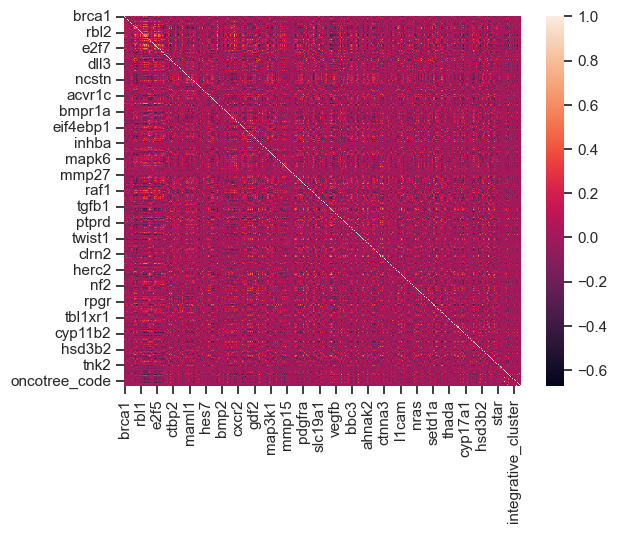

In [93]:
genetic_cat_corr= genetic_and_cat_df.corr()
sns.heatmap(genetic_cat_corr)

ANOVA

In [103]:
genetic_mean_comparion_df= pd.concat([df_genetic,df_clinical[["death_from_cancer"]]],axis=1)
genetic_mean_comparion_df.tail()

,brca1,brca2,palb2,pten,tp53,atm,cdh1,chek2,nbn,nf1,...,srd5a2,srd5a3,st7,star,tnk2,tulp4,ugt2b15,ugt2b17,ugt2b7,death_from_cancer
1899,0.1563,0.5543,-0.6149,0.4572,1.3822,-0.0537,-0.1323,0.2837,-0.0726,-0.5500,...,1.5304,1.1196,0.8116,0.0958,-1.2644,-0.3566,-0.2615,-0.6371,-0.5540,Living
1900,0.1343,0.9128,1.3017,0.7383,0.1841,0.0028,0.1243,2.2040,-0.6190,-0.8681,...,-0.6610,-0.1610,0.2251,0.5127,-0.3412,-1.0703,-0.6950,0.0641,-0.8863,Died of Disease
1901,1.8107,-0.2608,0.4006,-0.2985,0.0356,-0.1620,1.5486,1.5309,-1.3653,-0.2529,...,-0.5194,2.3968,0.5917,-0.8643,-1.3541,-1.8076,-0.1840,0.0967,-0.6264,Died of Disease
1902,-1.2746,-1.7695,-0.3454,-0.3850,0.6689,1.4531,1.0956,-0.0948,-0.6188,-1.9467,...,-1.5275,1.1070,0.2194,1.4317,-0.6985,-0.6046,-0.4915,-0.2847,-0.8041,Died of Other Causes
1903,-0.7525,0.7352,0.6448,-0.3241,-0.0434,1.7272,0.7193,3.1425,-0.2394,-0.5629,...,-0.9232,-0.3156,0.8828,0.7520,-1.4187,0.5257,-0.2316,-0.2081,-0.4328,Died of Other Causes


<AxesSubplot: >

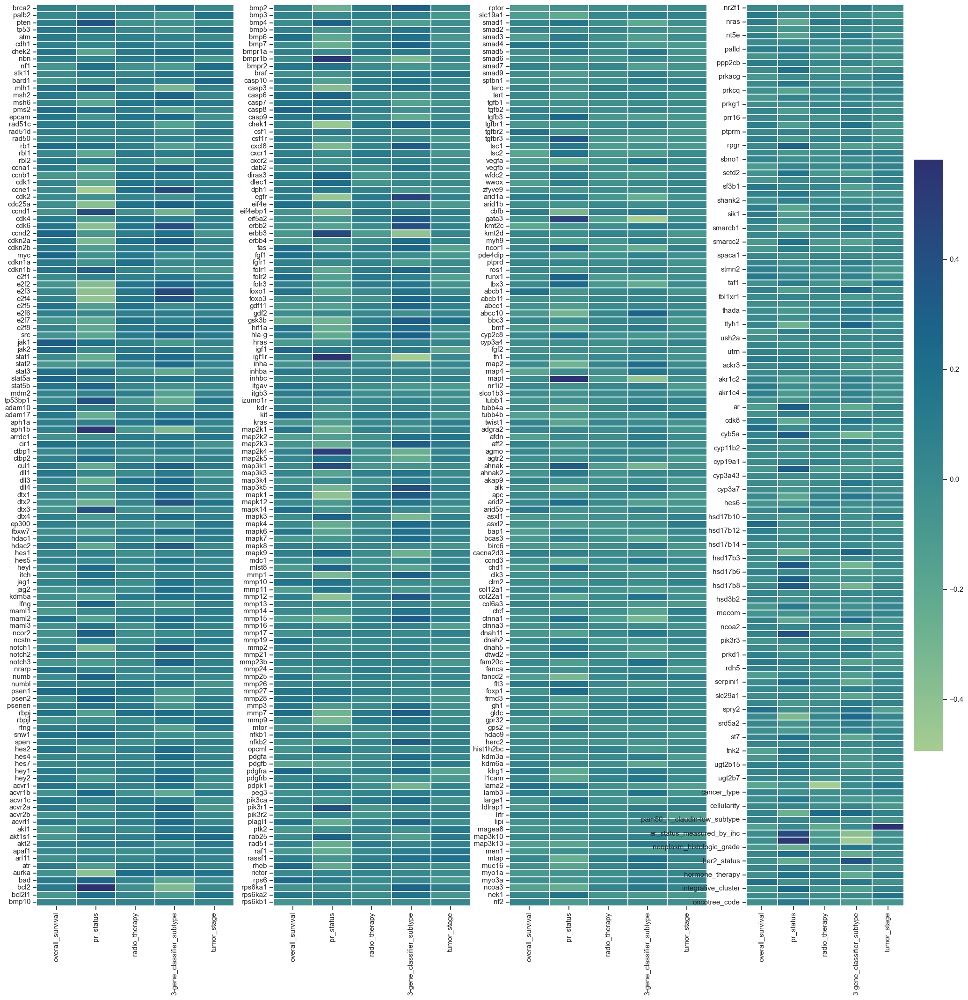

In [ ]:
#Make a heatmap for the correlationwhen 
f, axes = plt.subplots(1, 4, figsize=(25,25), sharex=False)
#plt.figure(figsize=(3,100))
sns.heatmap(genetic_cat_corr.iloc[:-6,-6:-1][1:125], cmap = "crest",linewidths=0.1, cbar = False, ax=axes[0])
sns.heatmap(genetic_cat_corr.iloc[:-6,-6:-1][126:250], cmap = "crest",linewidths=0.1, cbar = False,ax=axes[1])
sns.heatmap(genetic_cat_corr.iloc[:-6,-6:-1][251:375], cmap = "crest",linewidths=0.1, cbar = False,ax=axes[2])
sns.heatmap(genetic_cat_corr.iloc[:-6,-6:-1][376:593], cmap = "crest",linewidths=0.1, ax=axes[3])

Mutation Analysis

In [ ]:
df_mutation =data.iloc[:,520:]
df_mutation.head()

,pik3ca_mut,tp53_mut,muc16_mut,ahnak2_mut,kmt2c_mut,syne1_mut,gata3_mut,map3k1_mut,ahnak_mut,dnah11_mut,...,mtap_mut,ppp2cb_mut,smarcd1_mut,nras_mut,ndfip1_mut,hras_mut,prps2_mut,smarcb1_mut,stmn2_mut,siah1_mut
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,H178P,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,H1047R,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,E542K,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,S241F,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
unique_mutation=pd.DataFrame({"unique":df_mutation.nunique()})
unique_mutation.sort_values(by="unique",ascending= False).head(n=25)

,unique
tp53_mut,343
muc16_mut,298
ahnak2_mut,248
kmt2c_mut,222
syne1_mut,200
map3k1_mut,194
pik3ca_mut,160
dnah11_mut,154
ahnak_mut,153
cdh1_mut,140


In [ ]:
for col in df_mutation:
    df_mutation[col]=df_mutation[col].astype("category")

In [ ]:
df_mutation.duplicated().sum

<bound method NDFrame._add_numeric_operations.<locals>.sum of 0       False
1       False
2       False
3       False
4       False
        ...  
1899    False
1900    False
1901    False
1902    False
1903    False
Length: 1904, dtype: bool>